ALGORİTMA ADI: cycleGAN

DATASET ADI: horse2zebra (örnek dataset), maps (uygulanacak dataset)

ÖRNEK ADRESİ: https://keras.io/examples/generative/cyclegan/

ŞUBE: 2 / B

GRUP ÜYELERİNİN AD SOYAD VE NUMARALARI:

*   Zehra Bak - G211210011
*   Derya Çahan - G211210017
*   Sinem Şaziye Karaca - G211210025
*   Umut Bide - G211210079






ALGORİTMANIN TANIMI

GAN'lar (Generative Adversarial Networks), iki sinir ağından oluşan ve birbirleriyle rekabet ederek öğrenen bir yapay zeka mimarisi türüdür. CycleGAN ise, derin öğrenme ve bilgisayarlı görü modellemesi alanında görüntüler arasında stil transferi gerçekleştiren bir yapay zeka modelidir. Bu model, özellikle iki farklı görüntü seti arasında çeviri yapabilme yeteneği ile öne çıkar. CycleGAN, denetimsiz bir şekilde, etiketlenmiş veri setlerine ihtiyaç duymadan, iki farklı görüntü domaini arasındaki görüntüleri dönüştürebilir. Örneğin, bu ödevde uydu görüntülerini krokiye dönüştüren bir uygulama gerçekleştirilmiştir.

CycleGAN, zıt yönlerde çalışan iki temel sinir ağını içerir. Modelin bir yarısı, kaynak domain'den hedef domain'e görüntü çevirisi yapan bir çevirici (generator) ve bu çeviriyi değerlendiren bir ayırt edici (discriminator) içerir. Örneğin, bu yarıda atların görüntülerini alıp zebralara çeviren bir çevirici ve bu çevrilen görüntülerin inandırıcılığını değerlendiren bir ayırt edici bulunur.

Diğer yarı ise tam tersi yönde çalışır; hedef domain'den kaynak domain'e görüntü çevirisi yapar. Bu durumda, zebraları at görüntülerine çeviren bir çevirici ve bu dönüşümün başarısını değerlendiren bir ayırt edici bulunur. Her iki çevirici, karşı domain'deki görüntülerin stil ve dokusunu yakalamaya çalışırken, her iki ayırt edici de üretilen görüntülerin gerçekçilik seviyesini artırmak için çeviricileri zorlar. Bu çift yönlü yapı sayesinde, CycleGAN modeli iki farklı görüntü domaini arasında etkili bir şekilde stil transferi gerçekleştirebilir ve bu süreçte herhangi bir eşleştirilmiş veri setine ihtiyaç duymaz.



ÖRNEK TANITIMI VE DATASET TANITIMI

CycleGAN için kullanılan horse2zebra dataseti, atlar ve zebralar içeren görüntülerden oluşan özel bir veri setidir. Bu veri seti, CycleGAN'ın at görüntülerini zebralara ve zebraları at görüntülerine dönüştürme yeteneğini eğitmek ve test etmek için kullanılır. Temel olarak, bu dataset, atlar ve zebraların farklı ortamlarda ve farklı pozlarda çekilmiş görüntülerini içerir, böylece model bu iki farklı hayvan türünün görüntü özelliklerini öğrenip birbirlerine dönüştürebilir.

Datasetin Yapısı

Atlar (Horses): Dataset, çeşitli ortamlarda ve farklı açılardan çekilmiş at görüntüleri içerir. Bu görüntüler, atların farklı duruşları, hareketleri ve arka planları ile modelin atların genel özelliklerini öğrenmesini sağlar.

Zebralar (Zebras): Benzer şekilde, zebralar da çeşitli ortamlarda ve pozlarda görüntülenir. Zebraların benzersiz çizgili desenleri, modelin stil transferi yaparken bu özellikleri at görüntülerine aktarmasını gerektirir.

HORSE2ZEBRA DATASETİYLE ALGORİTMA ÖRNEĞİNİN ÇALIŞTIRILMASI

In [ ]:
!pip install tensorflow-addons

Burada Tensorflow'un resmi GitHub deposundan tensorflow/docs paketini yükleyen kod bloğunu çalıştırıyoruz.




In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import tensorflow_addons as tfa
import tensorflow_datasets as tfds

tfds.disable_progress_bar()
autotune = tf.data.AUTOTUNE

Bu kod bloğunda, derin öğrenme ve görüntü işleme projeleri için gerekli olan TensorFlow, TensorFlow Addons ve TensorFlow Datasets kütüphaneleri ile birlikte NumPy ve Matplotlib kütüphaneleri Python ortamına dahil edilmiştir.

In [ ]:
# Load the horse-zebra dataset using tensorflow-datasets.
dataset, _ = tfds.load("cycle_gan/horse2zebra", with_info=True, as_supervised=True)
train_horses, train_zebras = dataset["trainA"], dataset["trainB"]
test_horses, test_zebras = dataset["testA"], dataset["testB"]

# Define the standard image size.
orig_img_size = (286, 286)
# Size of the random crops to be used during training.
input_img_size = (256, 256, 3)
# Weights initializer for the layers.
kernel_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Gamma initializer for instance normalization.
gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

buffer_size = 256
batch_size = 1


def normalize_img(img):
    img = tf.cast(img, dtype=tf.float32)
    # Map values in the range [-1, 1]
    return (img / 127.5) - 1.0


def preprocess_train_image(img, label):
    # Random flip
    img = tf.image.random_flip_left_right(img)
    # Resize to the original size first
    img = tf.image.resize(img, [*orig_img_size])
    # Random crop to 256X256
    img = tf.image.random_crop(img, size=[*input_img_size])
    # Normalize the pixel values in the range [-1, 1]
    img = normalize_img(img)
    return img


def preprocess_test_image(img, label):
    # Only resizing and normalization for the test images.
    img = tf.image.resize(img, [input_img_size[0], input_img_size[1]])
    img = normalize_img(img)
    return img

Dataset cycle_gan downloaded and prepared to /root/tensorflow_datasets/cycle_gan/horse2zebra/3.0.0. Subsequent calls will reuse this data.


Sırasıyla bu kod blokları,

Bu kod bloğu, TensorFlow Datasets kullanarak horse2zebra veri setini yükler.

Eğitim ve test için at ve zebra görüntülerini ayırır.

Eğitim ve test görüntülerinin boyutları tanımlanır.

normalize_img Fonksiyonu: Görüntülerin piksel değerlerini [-1, 1] aralığına normalleştirir.

preprocess_train_image Fonksiyonu: Bu işlev eğitim görüntüleri için, görüntüleri rastgele yatay çevirme, orijinal boyuta yeniden boyutlandırma, rastgele kırpma ve normalleştirme işlemleri uygular.

preprocess_test_image Fonksiyonu: Bu işlev test görüntüleri için, sadece yeniden boyutlandırma ve normalleştirme işlemlerini uygular.



In [ ]:
# Apply the preprocessing operations to the training data
train_horses = (
    train_horses.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)
train_zebras = (
    train_zebras.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)

# Apply the preprocessing operations to the test data
test_horses = (
    test_horses.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)
test_zebras = (
    test_zebras.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)

Buradaki kod bloklarının ve fonksiyonlarının sırasıyla işlevleri şu şekildedir:

map Fonksiyonu: preprocess_train_image fonksiyonunu kullanarak her bir eğitim görüntüsü üzerinde yatay çevirme, yeniden boyutlandırma, rastgele kırpma ve normalleştirme işlemleri gerçekleştirilir. num_parallel_calls=autotune parametresi, bu işlemlerin I/O bloklamalarını en aza indirirken maksimum CPU kullanımı ile paralel olarak çalışmasını sağlar.

cache Metodu: Görüntüler, ilk erişimden sonra bellekte önbelleğe alınır, bu da tekrar eden erişimlerde okuma süresini azaltır ve veri yükleme işlemlerini hızlandırır.

shuffle Metodu: Görüntüleri karıştırarak modelin her epochta farklı sıralamalarla eğitilmesini sağlar, böylece modelin genelleme yeteneği artar. buffer_size parametresi, karıştırma işlemi için bellekte tutulacak öğe sayısını belirler.

batch Metodu: Görüntüleri belirlenen batch_size boyutunda gruplara ayırır. Bu işlem, modelin her seferinde birden fazla örnek üzerinde eğitim yapmasını sağlar ve genellikle GPU kullanımını optimize eder.

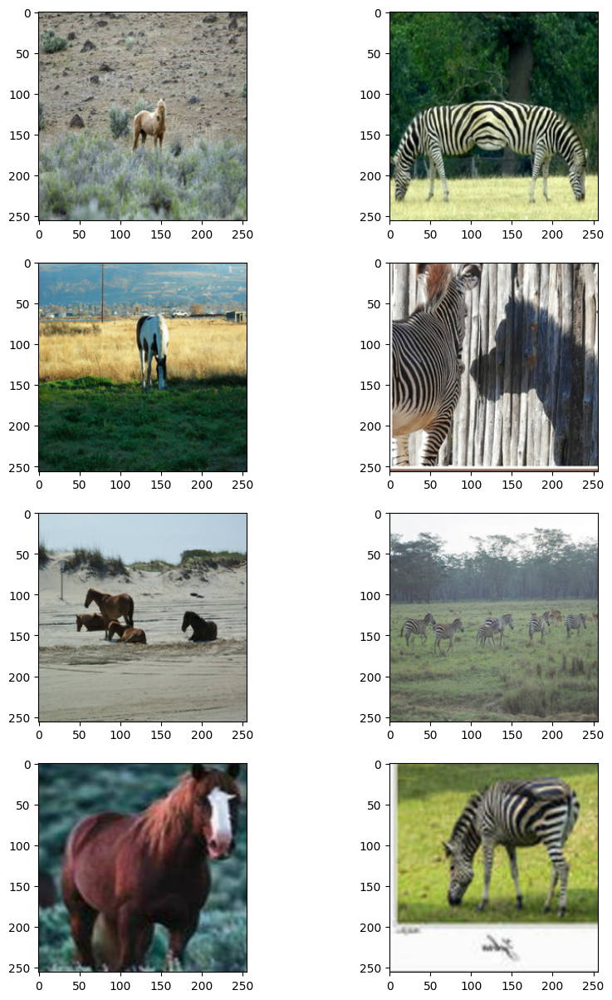

In [ ]:
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, samples in enumerate(zip(train_horses.take(4), train_zebras.take(4))):
    horse = (((samples[0][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    zebra = (((samples[1][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    ax[i, 0].imshow(horse)
    ax[i, 1].imshow(zebra)
plt.show()

Burada eğitim veri setinden alınmış dört at ve dört zebra görüntüsünü kullanarak bir görselleştirme oluşturulur. İlk olarak, 4 satır ve 2 sütundan oluşan bir figür oluşturulur, her bir satırda bir at ve bir zebra görüntüsü olacak şekilde düzenlenir. Görüntüler, [-1, 1] aralığından [0, 255] aralığına dönüştürülür, bu işlem görüntü piksellerini gerçek renk değerlerine çevirir. Dönüştürme işlemi, görüntüyü tensor formatından numpy dizisine çevirip dönüştürerek gerçekleştirilir. Bu süreç, eğitim setinden seçilen görüntülerin nasıl işlendiğini ve sonuçlarını gözlemlemek için kullanılır, böylece at ve zebra görüntülerinin model tarafından nasıl işlendiğini görsel olarak karşılaştırmak mümkün olur.









---



In [ ]:
class ReflectionPadding2D(layers.Layer):
    """Implements Reflection Padding as a layer.

    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.

    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super().__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tf.pad(input_tensor, padding_tensor, mode="REFLECT")


def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = activation(x)

    x = ReflectionPadding2D()(x)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.add([input_tensor, x])
    return x


def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x

İlk olarak, ReflectionPadding2D isimli bir katman tanımlanmaktadır; bu katman, giriş tensoruna yansıma yoluyla padding ekleyerek, görüntü kenarlarında oluşabilecek bozulmaların önüne geçer. Bu padding yöntemi kenar bölgelerde daha doğru bilgi işlemeyi sağlar.

Daha sonraki bölümde, üç ana işlevsel blok tanımlanır: residual_block, downsample, ve upsample. Residual_block içerisinde, giriş tensoru üzerinde iki konvolüsyon işlemi yapılır ve her konvolüsyon işlemi sonrasında örnek normalizasyon uygulanır. Bu işlemlerden sonra, giriş tensoru ile son konvolüsyon çıktısı toplanarak artık bağlantı kurulur. Bu yapı, ağın daha derin öğrenmesini sağlar.

Downsample fonksiyonu, modelin çözünürlüğünü azaltarak daha büyük alansal yapıları yakalamasına olanak tanırken, upsample fonksiyonu, detayların yeniden oluşturulmasına yardımcı olacak şekilde çözünürlüğü artırır. Her iki işlev de konvolüsyon (veya ters konvolüsyon) işlemleri, örnek normalizasyon ve aktivasyon fonksiyonları içerir, bu da her adımda verinin dönüşümünü ve modelin öğrenme yeteneğinin iyileştirilmesini sağlar. Bu özel katmanlar ve bloklar, görüntü işleme ve üretimi gibi karmaşık görevlerde kullanılan derin öğrenme modellerinin temel yapı taşlarını oluşturur.

In [ ]:
def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=2,
    num_residual_blocks=9,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None,
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(img_input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(
        x
    )
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.Activation("relu")(x)

    # Downsampling
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    # Residual blocks
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=layers.Activation("relu"))

    # Upsampling
    for _ in range(num_upsample_blocks):
        filters //= 2
        x = upsample(x, filters, activation=layers.Activation("relu"))

    # Final block
    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = layers.Conv2D(3, (7, 7), padding="valid")(x)
    x = layers.Activation("tanh")(x)

    model = keras.models.Model(img_input, x, name=name)
    return model

İlk olarak, model bir giriş katmanı tanımlayarak başlar; bu katman, belirlenen görüntü boyutlarına sahip tensorleri kabul eder. Ardından, bu giriş katmanı, yansıma padding ile genişletilir ve büyük bir konvolüsyon çekirdeği kullanarak ilk konvolüsyon işlemi gerçekleştirilir. Bu işlem sonrasında, örnek normalizasyon ve ReLU aktivasyon fonksiyonu uygulanır.

Her bir alt örnekleme adımında, filtre sayısı artırılır ve boyut küçültme (downsampling) işlemi gerçekleştirilir, bu da modelin daha büyük ve daha genel özellikleri yakalamasına olanak tanır. Alt örnekleme işleminden sonra, belirtilen sayıda residual blok eklenir. Her residual blok, girişin kendisi ile konvolüsyon ve normalizasyon işlemlerinin çıktısı arasında bir toplama işlemi gerçekleştirir.

Modelin yapılandırmasında ayrıca, bir dizi üst örnekleme (upsampling) bloğu da yer alır. Üst örnekleme blokları, filtre sayısını azaltarak ve konvolüsyon işlemleriyle görüntü boyutunu artırarak modelin detayları yeniden oluşturmasına yardımcı olur. Bu işlemler, yüksek çözünürlüklü görüntü üretiminde önemlidir.

Son olarak, modelin çıktı katmanına gelinir. Yansıma padding ile son bir genişleme yapıldıktan sonra, konvolüsyon işlemi ile 3 kanallı (genellikle renkli görüntüler için RGB) bir çıktı üretilir ve 'tanh' aktivasyon fonksiyonu ile sonuçlar [-1, 1] aralığına sıkıştırılır. Bu yapılanlar sonucunda, giriş görüntüsüne çeşitli dönüşümler uygulayarak, yeni ve stilize edilmiş bir görüntü üretimi gerçekleştirilmiş olur. Oluşturulan bu model, görsel içeriklerin stil transferi gibi görevlerde etkili bir şekilde kullanılabilir.

In [ ]:
def get_discriminator(
    filters=64, kernel_initializer=kernel_init, num_downsampling=3, name=None
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = layers.Conv2D(
        filters,
        (4, 4),
        strides=(2, 2),
        padding="same",
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = layers.LeakyReLU(0.2)(x)

    num_filters = filters
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(1, 1),
            )

    x = layers.Conv2D(
        1, (4, 4), strides=(1, 1), padding="same", kernel_initializer=kernel_initializer
    )(x)

    model = keras.models.Model(inputs=img_input, outputs=x, name=name)
    return model


# Get the generators
gen_G = get_resnet_generator(name="generator_G")
gen_F = get_resnet_generator(name="generator_F")

# Get the discriminators
disc_X = get_discriminator(name="discriminator_X")
disc_Y = get_discriminator(name="discriminator_Y")

Bu kod parçası, bir CycleGAN modeli için ayırıcı (discriminator) ve üretici (generator) ağ modelleri tanımlamaktadır. get_discriminator fonksiyonu, bir discriminator modeli oluşturur. Bu model, ilk olarak bir giriş katmanı alır ve ardından bir konvolüsyon katmanı ile işleme başlar. Bu ilk katmanda, belirli bir filtre boyutu, çekirdek boyutu ve adım aralığı kullanılarak özellik haritaları elde edilir ve LeakyReLU aktivasyon fonksiyonu uygulanır. Model, parametre olarak verilen sayıda alt örnekleme bloğu (downsampling) ile devam eder; bu bloklar, konvolüsyon katmanları ve aktivasyon fonksiyonları içerir. Her bir alt örnekleme bloğunda filtre sayısı artar ve görüntü boyutları azalır, bu sayede model, giriş görüntüsünün daha soyut ve kapsamlı özelliklerini çıkarabilir. Alt örnekleme işlemleri sonrasında, bir konvolüsyon katmanı ile modelin çıktısı bir ölçeklendirilmiş skora dönüştürülür.

Aynı zamanda, get_resnet_generator fonksiyonu iki kez çağrılarak, CycleGAN modeli için iki farklı generator modeli oluşturulur. Her generator, giriş görüntüsünü alıp stilize edilmiş bir çıktı üretmek üzere tasarlanmıştır. Bu generatorler, yansıma padding, konvolüsyon katmanları, aktivasyon fonksiyonları, residual bloklar, alt ve üst örnekleme işlemleri içerir. Bu yapı, giriş görüntüsünü alarak, öğrenilen özellikler üzerinden yeni bir görüntü üretimi gerçekleştirir. Oluşturulan her bir model (iki generator ve iki discriminator), CycleGAN mimarisinin çekirdek bileşenlerini oluşturur ve bu bileşenler, birbirlerinin çıktılarını eğitim sürecinde sürekli olarak değerlendirerek modelin genel performansını iyileştirir. Bu modeller, bir domain'den diğerine görüntü çevirisi yapabilme yeteneğini kazanmış olur.

In [ ]:
class CycleGan(keras.Model):
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=10.0,
        lambda_identity=0.5,
    ):
        super().__init__()
        self.gen_G = generator_G
        self.gen_F = generator_F
        self.disc_X = discriminator_X
        self.disc_Y = discriminator_Y
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity

    def compile(
        self,
        gen_G_optimizer,
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn,
        disc_loss_fn,
    ):
        super().compile()
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = keras.losses.MeanAbsoluteError()
        self.identity_loss_fn = keras.losses.MeanAbsoluteError()

    def train_step(self, batch_data):
        # x is Horse and y is zebra
        real_x, real_y = batch_data

        # For CycleGAN, we need to calculate different
        # kinds of losses for the generators and discriminators.
        # We will perform the following steps here:
        #
        # 1. Pass real images through the generators and get the generated images
        # 2. Pass the generated images back to the generators to check if we
        #    can predict the original image from the generated image.
        # 3. Do an identity mapping of the real images using the generators.
        # 4. Pass the generated images in 1) to the corresponding discriminators.
        # 5. Calculate the generators total loss (adversarial + cycle + identity)
        # 6. Calculate the discriminators loss
        # 7. Update the weights of the generators
        # 8. Update the weights of the discriminators
        # 9. Return the losses in a dictionary

        with tf.GradientTape(persistent=True) as tape:
            # Horse to fake zebra
            fake_y = self.gen_G(real_x, training=True)
            # Zebra to fake horse -> y2x
            fake_x = self.gen_F(real_y, training=True)

            # Cycle (Horse to fake zebra to fake horse): x -> y -> x
            cycled_x = self.gen_F(fake_y, training=True)
            # Cycle (Zebra to fake horse to fake zebra) y -> x -> y
            cycled_y = self.gen_G(fake_x, training=True)

            # Identity mapping
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Discriminator output
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Generator adversarial loss
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator cycle loss
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )

        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
        }

Bu kod parçası, CycleGan isimli bir sınıf tanımlar ve CycleGAN modelinin temel işlevlerini içerir. Bu model, dört ana bileşenden oluşur: iki generator ve iki discriminator. Generatorlar, bir domain'den diğerine (örneğin atları zebralara ve zebraları atlara dönüştürmek) görüntüleri çevirmek için kullanılırken, discriminatorlar, üretilen görüntülerin gerçekçilik seviyesini değerlendirir.

Modelin train_step metodu, eğitim sürecinin bir adımını gerçekleştirir ve bu süreçte bir dizi hesaplama yapılır. İlk olarak, gerçek görüntüler generatorlar tarafından işlenir ve sahte görüntüler üretilir. Daha sonra, üretilen sahte görüntüler tekrar ilgili generatorlara verilerek orijinal görüntülere dönüştürülmeye çalışılır. Aynı zamanda, generatorlar tarafından gerçek görüntülerin kendilerine dönüştürülmesi denemesi yapılır. Üretilen sahte görüntüler ilgili discriminatorlar tarafından değerlendirilir ve bu değerlendirmeler sonucunda generator ve discriminator kayıpları hesaplanır.

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=4):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(4, 2, figsize=(12, 12))
        for i, img in enumerate(test_horses.take(self.num_img)):
            prediction = self.model.gen_G(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Input image")
            ax[i, 1].set_title("Translated image")
            ax[i, 0].axis("off")
            ax[i, 1].axis("off")

            prediction = keras.utils.array_to_img(prediction)
            prediction.save(
                "generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch + 1)
            )
        plt.show()
        plt.close()

GANMonitor sınıfı,bir CycleGAN eğitimi sırasında her epoch sonunda görüntü üretimi ve kaydetme işlevi gerçekleştirir, modelin eğitim sürecini görselleştirme amacı taşır ve modelin her epoch sonunda nasıl performans gösterdiğini kontrol etmek için kullanılır.

Sınıfın başlangıcında, __init__ fonksiyonu ile görselleştirilecek görüntü sayısı tanımlanır. on_epoch_end metodu, her epoch sonunda otomatik olarak çağrılır. Bu metod içinde, test setinden alınan at görüntüleri kullanılarak, modelin bu görüntüleri nasıl zebra görüntülerine çevirdiği görselleştirilir. Her bir at görüntüsü için, generator kullanılarak bir zebra görüntüsü tahmini yapılır.

Üretilen her bir zebra görüntüsü, ilgili epoch numarası ve görüntü indeksi ile dosya olarak kaydedilir. Bu işlem, modelin zaman içindeki gelişimini belgelemek ve görsel olarak değerlendirmek için önemlidir. Son olarak, oluşturulan görseller ekranda gösterilir.

1067/1067 [==============================] - ETA: 0s - G_loss: 4.5045 - F_loss: 4.1097 - D_X_loss: 0.1720 - D_Y_loss: 0.1088

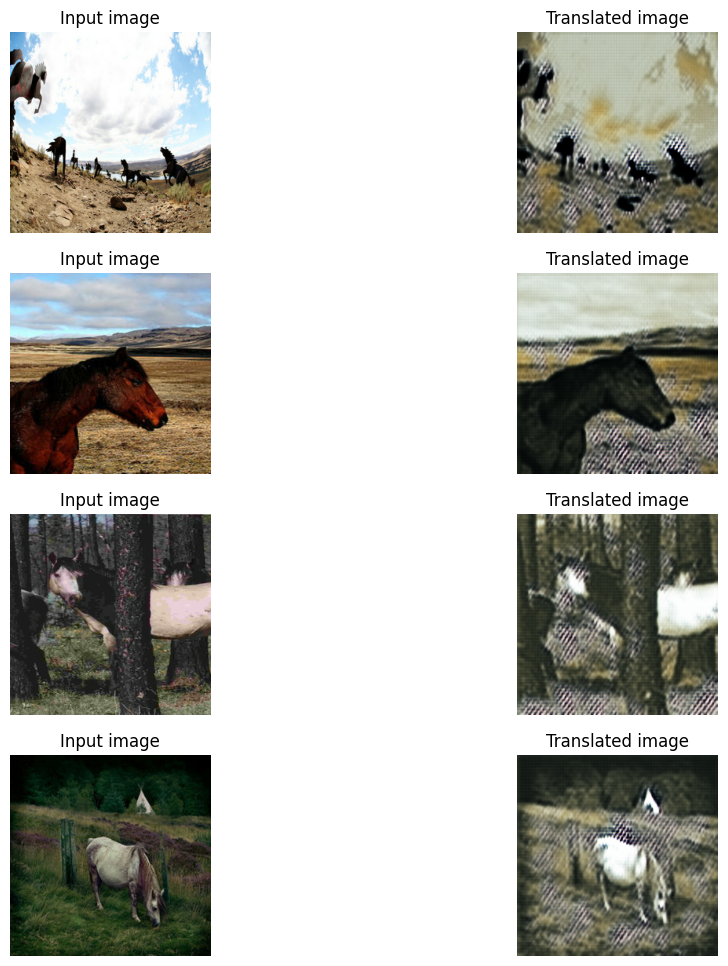

1067/1067 [==============================] - 318s 250ms/step - G_loss: 4.5043 - F_loss: 4.1089 - D_X_loss: 0.1721 - D_Y_loss: 0.1090


In [ ]:
# Loss function for evaluating adversarial loss
adv_loss_fn = keras.losses.MeanSquaredError()

# Define the loss function for the generators
def generator_loss_fn(fake):
    fake_loss = adv_loss_fn(tf.ones_like(fake), fake)
    return fake_loss


# Define the loss function for the discriminators
def discriminator_loss_fn(real, fake):
    real_loss = adv_loss_fn(tf.ones_like(real), real)
    fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5


# Create cycle gan model
cycle_gan_model = CycleGan(
    generator_G=gen_G, generator_F=gen_F, discriminator_X=disc_X, discriminator_Y=disc_Y
)

# Compile the model
cycle_gan_model.compile(
    gen_G_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks
plotter = GANMonitor()
checkpoint_filepath = "./model_checkpoints/cyclegan_checkpoints.{epoch:03d}"
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath, save_weights_only=True
)

# Here we will train the model for just one epoch as each epoch takes around
# 7 minutes on a single P100 backed machine.
cycle_gan_model.fit(
    tf.data.Dataset.zip((train_horses, train_zebras)),
    epochs=1,
    callbacks=[plotter, model_checkpoint_callback],
)

Bu kısım, CycleGAN modelinin yapılandırılması, derlenmesi ve eğitiminin gerçekleştirilmesi işlemlerini kapsar. İlk olarak kayıp fonksiyonları tanımlanır: generator için sahte görüntülerin gerçek olarak tanınma olasılığını, discriminator için ise gerçek görüntülerin gerçek ve sahte görüntülerin sahte olarak doğru sınıflandırılma olasılıklarını hesaplar. Ardından, CycleGAN modeli iki generator ve iki discriminator içerecek şekilde oluşturulur. Modelin eğitimi sırasında, her epoch sonrası üretilen görüntülerin kaydedilmesi ve görselleştirilmesi için GANMonitor, modelin ağırlıklarının kaydedilmesi için ModelCheckpoint kullanılır. Eğitim işlemi, bir epoch için planlanmıştır ve bu süreçte modelin atları zebralara ve zebraları atlara dönüştürme yeteneğinin gelişimi izlenir.

In [ ]:
!curl -LO https://github.com/AakashKumarNain/CycleGAN_TF2/releases/download/v1.0/saved_checkpoints.zip
!unzip -qq saved_checkpoints.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  273M  100  273M    0     0   151M      0  0:00:01  0:00:01 --:--:--  249M


Bu iki komut, internet üzerinden eğitilmiş bir CycleGAN modelinin kaydedilmiş ağırlıklarını içeren bir dosyayı indirmek ve bu dosyayı sistemde açmak için kullanılır. İlk komut olan curl ile GitHub'da bulunan ve önceden eğitilmiş model ağırlıklarını içeren saved_checkpoints.zip dosyası belirtilen URL'den alınır.

Weights loaded successfully


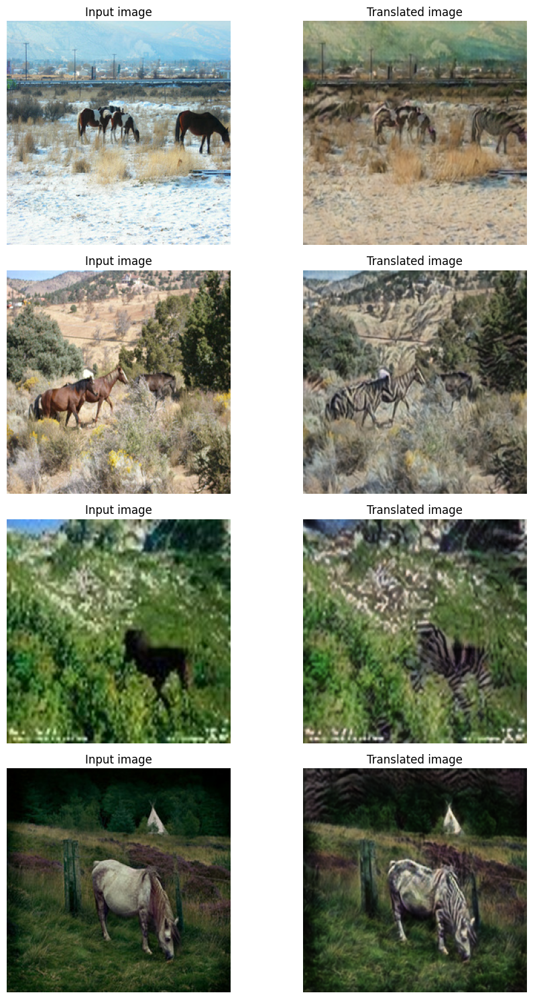

In [ ]:
# Load the checkpoints
weight_file = "./saved_checkpoints/cyclegan_checkpoints.090"
cycle_gan_model.load_weights(weight_file).expect_partial()
print("Weights loaded successfully")

_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(test_horses.take(4)):
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = keras.utils.array_to_img(prediction)
    prediction.save("predicted_img_{i}.png".format(i=i))
plt.tight_layout()
plt.show()


Bu kod bloğu, önceden eğitilmiş bir CycleGAN modelinin ağırlıklarını yükleyerek, modelin at görüntülerini zebralar olarak dönüştürme yeteneğini test etmek için kullanılır.

Daha sonra, test setinden alınan dört at görüntüsü için tahminler gerçekleştirilir. Her bir görüntü, modelin generator gen_G tarafından işlenir.  Görüntüler, model tarafından zebraya dönüştürülür.

Bu işlemler sonrasında bir görselleştirme yapısı kurulur. Sol tarafta orijinal at görüntüsü ve sağ tarafta dönüştürülmüş zebra görüntüsü gösterilir. Dönüştürülen her bir zebra görüntüsü, bir görüntü dosyasına dönüştürülür ve belirlenen isim formatıyla kaydedilir. Tüm görselleştirme işlemleri tamamlandıktan sonra, oluşturulan figürler gösterilir.

BURAYA KADARKİ KISIMDA KERASTAN DEĞİŞTİRMEYİ VE KENDİ BULDUĞUMUZ DATASET İLE EĞİTMEYİ DÜŞÜNDÜĞÜMÜZ CYCLEGAN MODELİNİ ANLATTIK.
ŞİMDİ BU PROJEYİ MAPS DATASETİ İÇİN DEĞİŞTİRECEĞİZ VE ÇIKTILARI OLUŞTURACAĞIZ.

In [ ]:
!pip install tensorflow-addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 8.6 MB/s eta 0:00:00


Burada bu komutu Python programlama dilinde TensorFlow ekosistemi için ek işlevler sağlayan tensorflow-addons kütüphanesini yüklemek için kullandık.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import tensorflow_addons as tfa
import tensorflow_datasets as tfds

tfds.disable_progress_bar()
autotune = tf.data.AUTOTUNE

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


Bu kısımda, bir TensorFlow tabanlı derin öğrenme projesi için gerekli kütüphaneleri yüklenir ve bazı temel yapılandırmalar gerçekleştirilir. Kaggle'dan alınan maps dataseti CycleGAN Algoritma Örneğine entegre edilir.

In [ ]:
# Load the horse-zebra dataset using tensorflow-datasets.
dataset, _ = tfds.load("cycle_gan/maps", with_info=True, as_supervised=True)
train_real, train_unreal = dataset["trainA"], dataset["trainB"]
test_real, test_unreal = dataset["testA"], dataset["testB"]


# Define the standard image size.
orig_img_size = (286, 286)
# Size of the random crops to be used during training.
input_img_size = (256, 256, 3)
# Weights initializer for the layers.
kernel_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Gamma initializer for instance normalization.
gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

buffer_size = 256
batch_size = 1


def normalize_img(img):
    img = tf.cast(img, dtype=tf.float32)
    # Map values in the range [-1, 1]
    return (img / 127.5) - 1.0


def preprocess_train_image(img, label):
    # Random flip
    img = tf.image.random_flip_left_right(img)
    # Resize to the original size first
    img = tf.image.resize(img, [*orig_img_size])
    # Random crop to 256X256
    img = tf.image.random_crop(img, size=[*input_img_size])
    # Normalize the pixel values in the range [-1, 1]
    img = normalize_img(img)
    return img


def preprocess_test_image(img, label):
    # Only resizing and normalization for the test images.
    img = tf.image.resize(img, [input_img_size[0], input_img_size[1]])
    img = normalize_img(img)
    return img

Dataset cycle_gan downloaded and prepared to /root/tensorflow_datasets/cycle_gan/maps/3.0.0. Subsequent calls will reuse this data.


Bu kod parçası, CycleGAN modelinin eğitimi için "maps" veri setini yükler ve bu veri setini işleyerek modele uygun hale getirir. Öncelikle, TensorFlow Datasets kullanılarak "maps" veri seti yüklenir ve eğitim ile test setlerine ayrılır.

In [ ]:
# Apply the preprocessing operations to the training data
train_real = (
    train_real.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)
train_unreal = (
    train_unreal.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)

# Apply the preprocessing operations to the test data
test_real = (
    test_real.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)
test_unreal = (
    test_unreal.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)

Bu kod parçası, eğitim ve test veri setleri üzerinde önceden tanımlanmış ön işleme fonksiyonlarını uygulayarak, veri setlerini modelin eğitimine uygun hale getirir. Eğitim verileri için train_real ve train_unreal veri setleri, preprocess_train_image fonksiyonu ile işlenir.

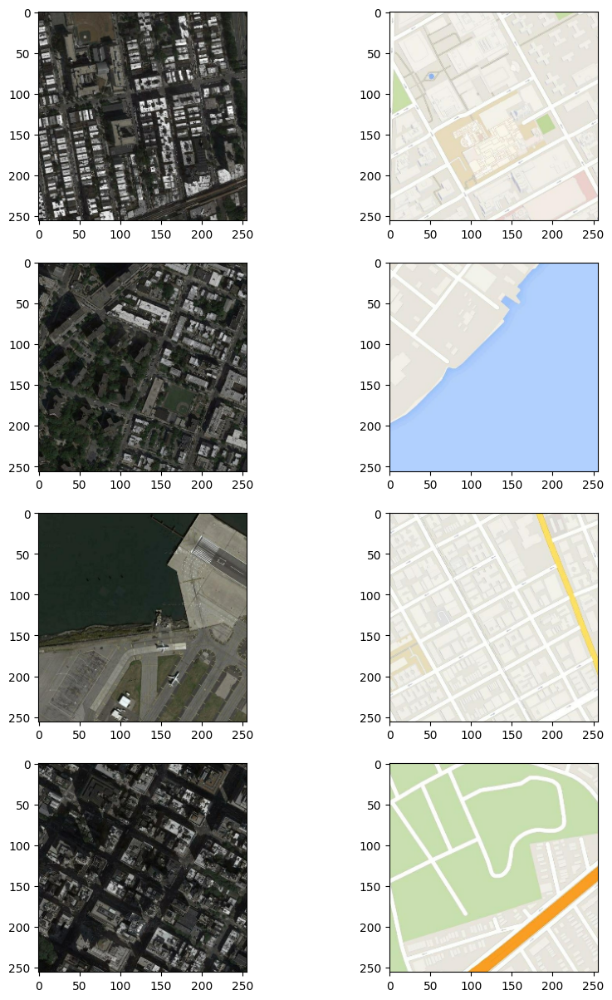

In [ ]:
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, samples in enumerate(zip(train_real.take(4), train_unreal.take(4))):
    real = (((samples[0][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    unreal = (((samples[1][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    ax[i, 0].imshow(real)
    ax[i, 1].imshow(unreal)
plt.show()

Bu kısımda, train_real ve train_unreal veri setlerinden dört örnek alınarak birleştirilir.

Ekrandaki sol sütunda gerçek görüntüler (real), sağ sütunda ise yapay görüntüler (unreal) yer alır.

In [ ]:
class ReflectionPadding2D(layers.Layer):
    """Implements Reflection Padding as a layer.

    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.

    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super().__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tf.pad(input_tensor, padding_tensor, mode="REFLECT")


def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = activation(x)

    x = ReflectionPadding2D()(x)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.add([input_tensor, x])
    return x


def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x

In [ ]:
def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=2,
    num_residual_blocks=9,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None,
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(img_input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(
        x
    )
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.Activation("relu")(x)

    # Downsampling
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    # Residual blocks
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=layers.Activation("relu"))

    # Upsampling
    for _ in range(num_upsample_blocks):
        filters //= 2
        x = upsample(x, filters, activation=layers.Activation("relu"))

    # Final block
    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = layers.Conv2D(3, (7, 7), padding="valid")(x)
    x = layers.Activation("tanh")(x)

    model = keras.models.Model(img_input, x, name=name)
    return model

In [ ]:
def get_discriminator(
    filters=64, kernel_initializer=kernel_init, num_downsampling=3, name=None
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = layers.Conv2D(
        filters,
        (4, 4),
        strides=(2, 2),
        padding="same",
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = layers.LeakyReLU(0.2)(x)

    num_filters = filters
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(1, 1),
            )

    x = layers.Conv2D(
        1, (4, 4), strides=(1, 1), padding="same", kernel_initializer=kernel_initializer
    )(x)

    model = keras.models.Model(inputs=img_input, outputs=x, name=name)
    return model


# Get the generators
gen_G = get_resnet_generator(name="generator_G")
gen_F = get_resnet_generator(name="generator_F")

# Get the discriminators
disc_X = get_discriminator(name="discriminator_X")
disc_Y = get_discriminator(name="discriminator_Y")

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


In [ ]:
class CycleGan(keras.Model):
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=10.0,
        lambda_identity=0.5,
    ):
        super().__init__()
        self.gen_G = generator_G
        self.gen_F = generator_F
        self.disc_X = discriminator_X
        self.disc_Y = discriminator_Y
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity

    def compile(
        self,
        gen_G_optimizer,
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn,
        disc_loss_fn,
    ):
        super().compile()
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = keras.losses.MeanAbsoluteError()
        self.identity_loss_fn = keras.losses.MeanAbsoluteError()

    def train_step(self, batch_data):
        # x is Horse and y is zebra
        real_x, real_y = batch_data

        # For CycleGAN, we need to calculate different
        # kinds of losses for the generators and discriminators.
        # We will perform the following steps here:
        #
        # 1. Pass real images through the generators and get the generated images
        # 2. Pass the generated images back to the generators to check if we
        #    can predict the original image from the generated image.
        # 3. Do an identity mapping of the real images using the generators.
        # 4. Pass the generated images in 1) to the corresponding discriminators.
        # 5. Calculate the generators total loss (adversarial + cycle + identity)
        # 6. Calculate the discriminators loss
        # 7. Update the weights of the generators
        # 8. Update the weights of the discriminators
        # 9. Return the losses in a dictionary

        with tf.GradientTape(persistent=True) as tape:
            # Horse to fake zebra
            fake_y = self.gen_G(real_x, training=True)
            # Zebra to fake horse -> y2x
            fake_x = self.gen_F(real_y, training=True)

            # Cycle (Horse to fake zebra to fake horse): x -> y -> x
            cycled_x = self.gen_F(fake_y, training=True)
            # Cycle (Zebra to fake horse to fake zebra) y -> x -> y
            cycled_y = self.gen_G(fake_x, training=True)

            # Identity mapping
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Discriminator output
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Generator adversarial loss
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator cycle loss
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )

        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
        }

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=4):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(4, 2, figsize=(12, 12))
        for i, img in enumerate(test_real.take(self.num_img)):
            prediction = self.model.gen_G(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Input image")
            ax[i, 1].set_title("Translated image")
            ax[i, 0].axis("off")
            ax[i, 1].axis("off")

            prediction = keras.utils.array_to_img(prediction)
            prediction.save(
                "generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch + 1)
            )
        plt.show()
        plt.close()

`on_epoch_end` metodu, her epoch'un sonunda çağrılır. Bu metod içinde, 4 satır ve 2 sütundan oluşan bir figür oluşturulur. Her satırda, test veri setinden alınan bir gerçek görüntü (`test_real`) ve model tarafından üretilen tahmini görüntü yan yana gösterilir. Sol sütunda orijinal görüntü, sağ sütunda ise model tarafından üretilen çevrilmiş görüntü yer alır.

Epoch 1/10
1096/1096 [==============================] - ETA: 0s - G_loss: 2.3714 - F_loss: 3.1220 - D_X_loss: 0.1638 - D_Y_loss: 0.1802

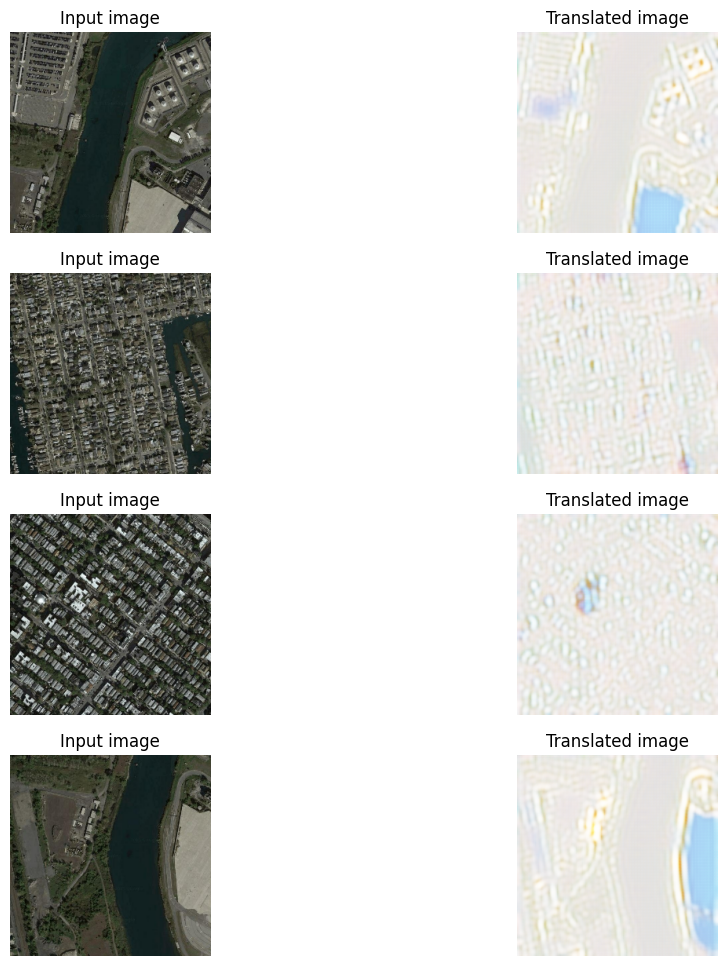

1096/1096 [==============================] - 332s 249ms/step - G_loss: 2.3714 - F_loss: 3.1219 - D_X_loss: 0.1638 - D_Y_loss: 0.1801
Epoch 2/10
1096/1096 [==============================] - ETA: 0s - G_loss: 1.7989 - F_loss: 2.8867 - D_X_loss: 0.1670 - D_Y_loss: 0.1866

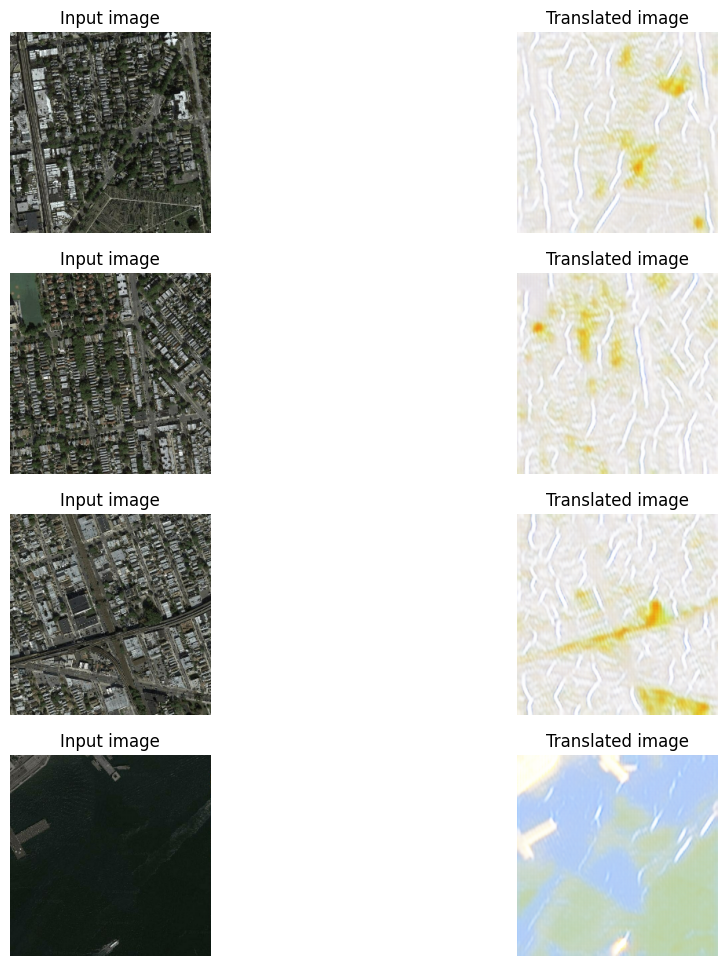

1096/1096 [==============================] - 272s 248ms/step - G_loss: 1.7997 - F_loss: 2.8865 - D_X_loss: 0.1670 - D_Y_loss: 0.1866
Epoch 3/10
1096/1096 [==============================] - ETA: 0s - G_loss: 1.6408 - F_loss: 2.5974 - D_X_loss: 0.2240 - D_Y_loss: 0.2034

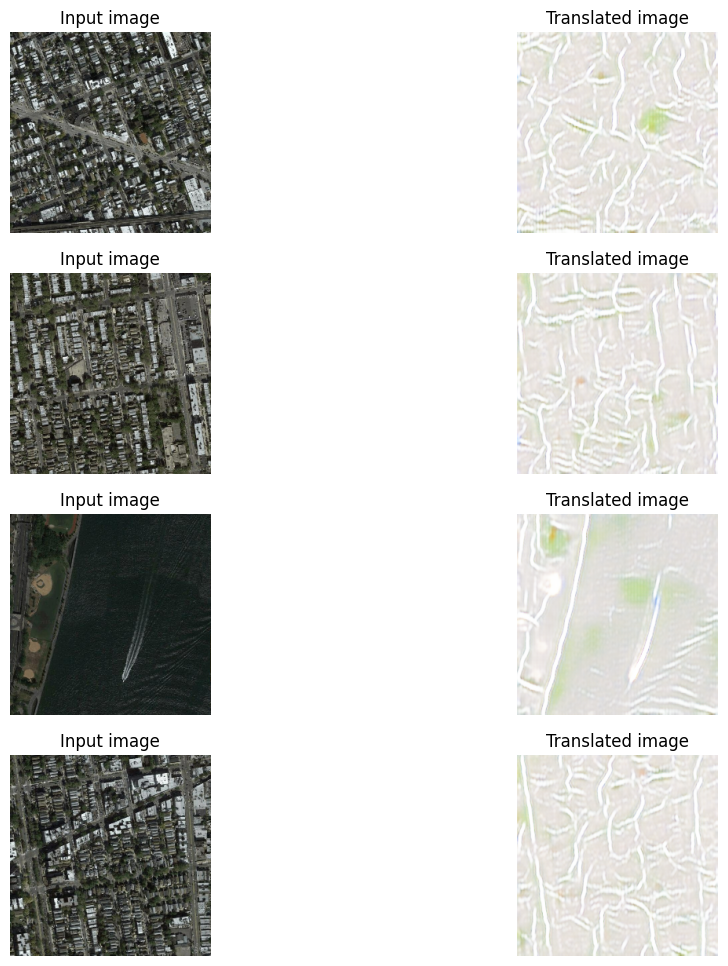

1096/1096 [==============================] - 271s 248ms/step - G_loss: 1.6406 - F_loss: 2.5970 - D_X_loss: 0.2240 - D_Y_loss: 0.2034
Epoch 4/10
1096/1096 [==============================] - ETA: 0s - G_loss: 1.5781 - F_loss: 2.6215 - D_X_loss: 0.2077 - D_Y_loss: 0.1880

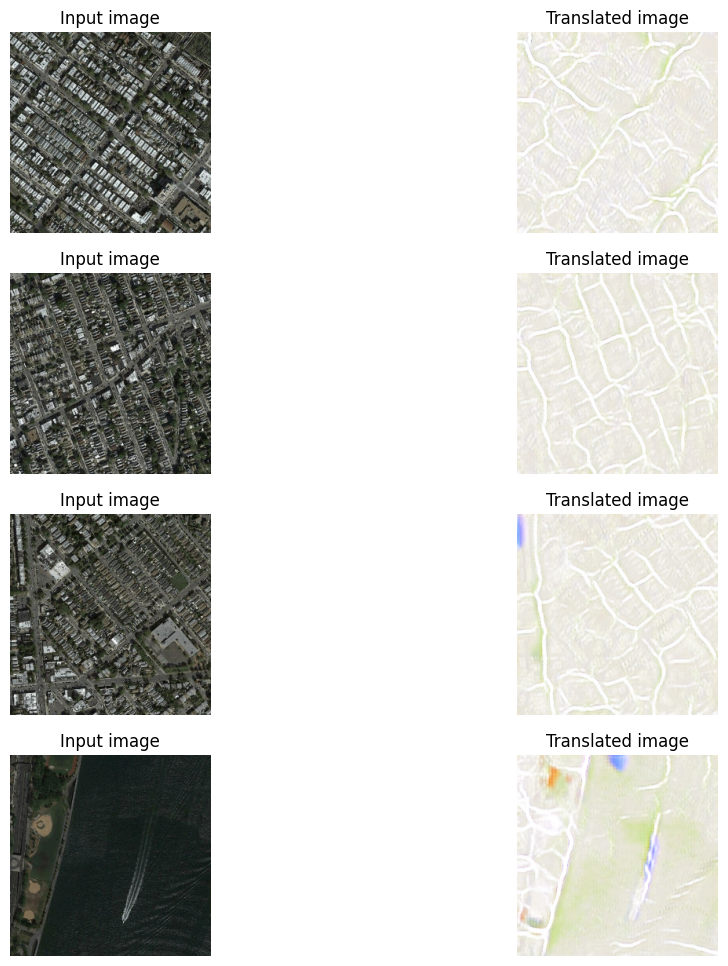

1096/1096 [==============================] - 272s 248ms/step - G_loss: 1.5793 - F_loss: 2.6223 - D_X_loss: 0.2077 - D_Y_loss: 0.1879
Epoch 5/10
1096/1096 [==============================] - ETA: 0s - G_loss: 1.5253 - F_loss: 2.4607 - D_X_loss: 0.2218 - D_Y_loss: 0.1896

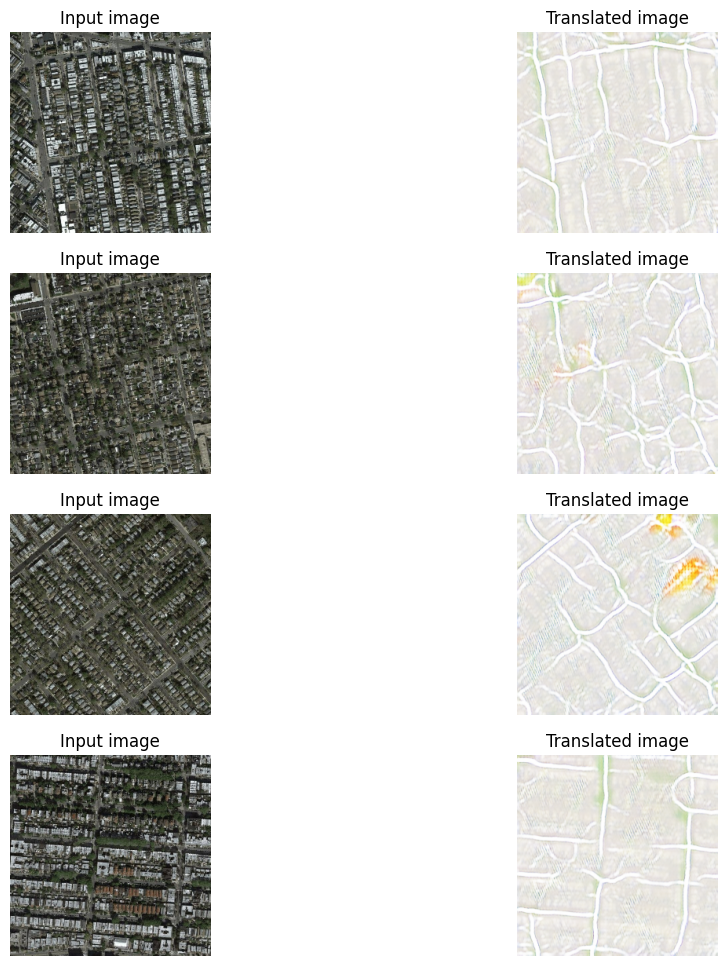

1096/1096 [==============================] - 272s 248ms/step - G_loss: 1.5251 - F_loss: 2.4613 - D_X_loss: 0.2218 - D_Y_loss: 0.1896
Epoch 6/10
1096/1096 [==============================] - ETA: 0s - G_loss: 1.4929 - F_loss: 2.3798 - D_X_loss: 0.2194 - D_Y_loss: 0.1874

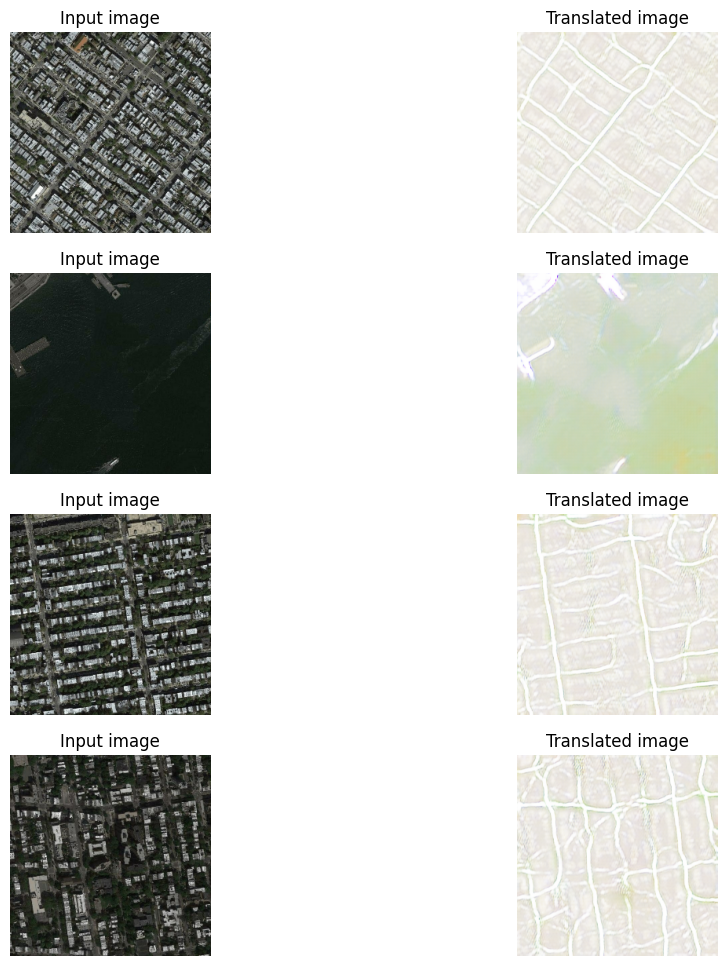

1096/1096 [==============================] - 272s 248ms/step - G_loss: 1.4929 - F_loss: 2.3795 - D_X_loss: 0.2193 - D_Y_loss: 0.1874
Epoch 7/10
1096/1096 [==============================] - ETA: 0s - G_loss: 1.4163 - F_loss: 2.3151 - D_X_loss: 0.2219 - D_Y_loss: 0.1823

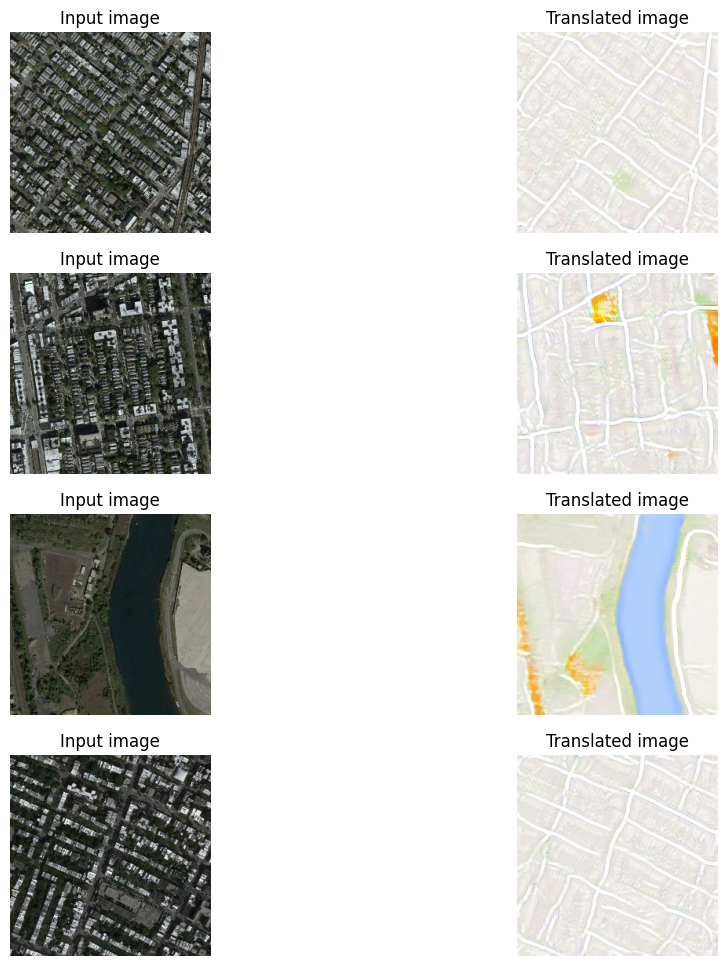

1096/1096 [==============================] - 271s 248ms/step - G_loss: 1.4161 - F_loss: 2.3141 - D_X_loss: 0.2219 - D_Y_loss: 0.1823
Epoch 8/10
1096/1096 [==============================] - ETA: 0s - G_loss: 1.4273 - F_loss: 2.2610 - D_X_loss: 0.2233 - D_Y_loss: 0.1778

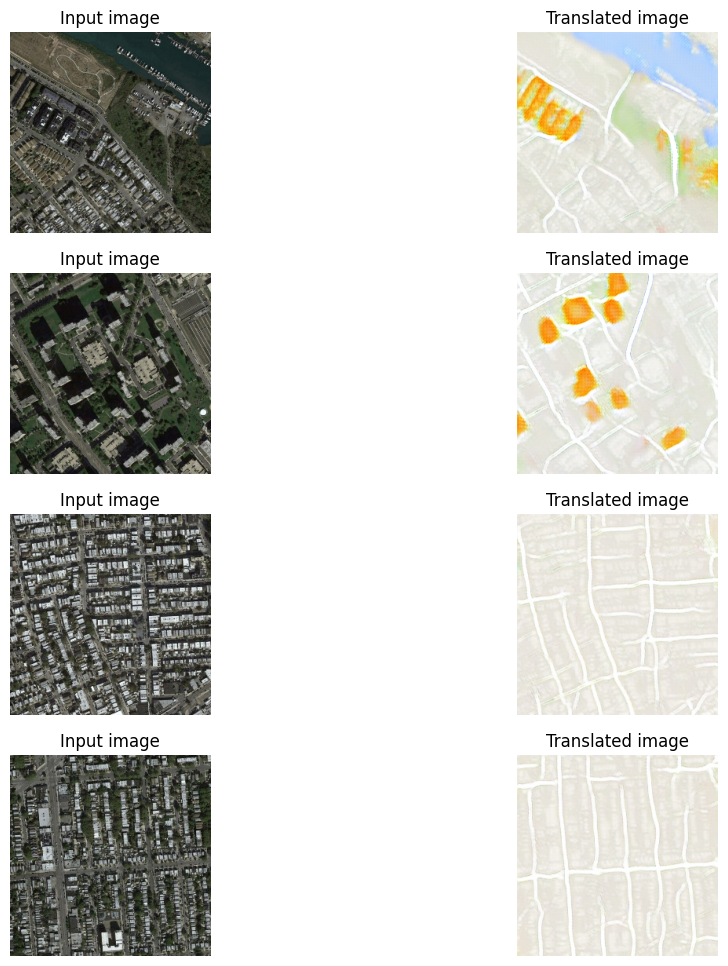

1096/1096 [==============================] - 271s 248ms/step - G_loss: 1.4274 - F_loss: 2.2615 - D_X_loss: 0.2233 - D_Y_loss: 0.1779
Epoch 9/10
1096/1096 [==============================] - ETA: 0s - G_loss: 1.3882 - F_loss: 2.1875 - D_X_loss: 0.2232 - D_Y_loss: 0.1755

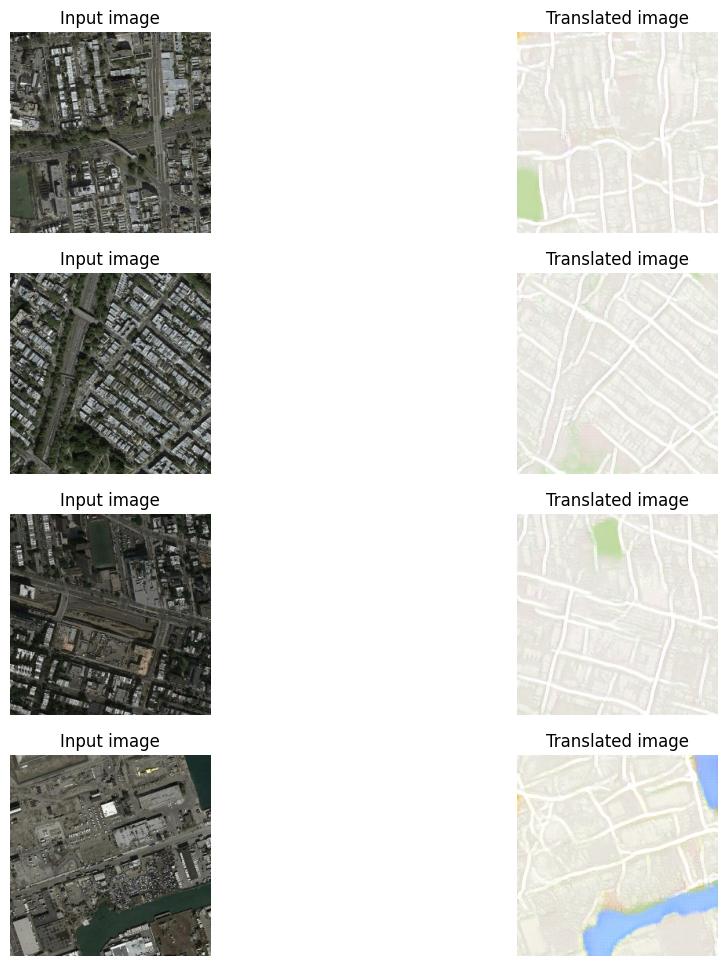

1096/1096 [==============================] - 272s 248ms/step - G_loss: 1.3882 - F_loss: 2.1872 - D_X_loss: 0.2232 - D_Y_loss: 0.1755
Epoch 10/10
1096/1096 [==============================] - ETA: 0s - G_loss: 1.3936 - F_loss: 2.1523 - D_X_loss: 0.2228 - D_Y_loss: 0.1798

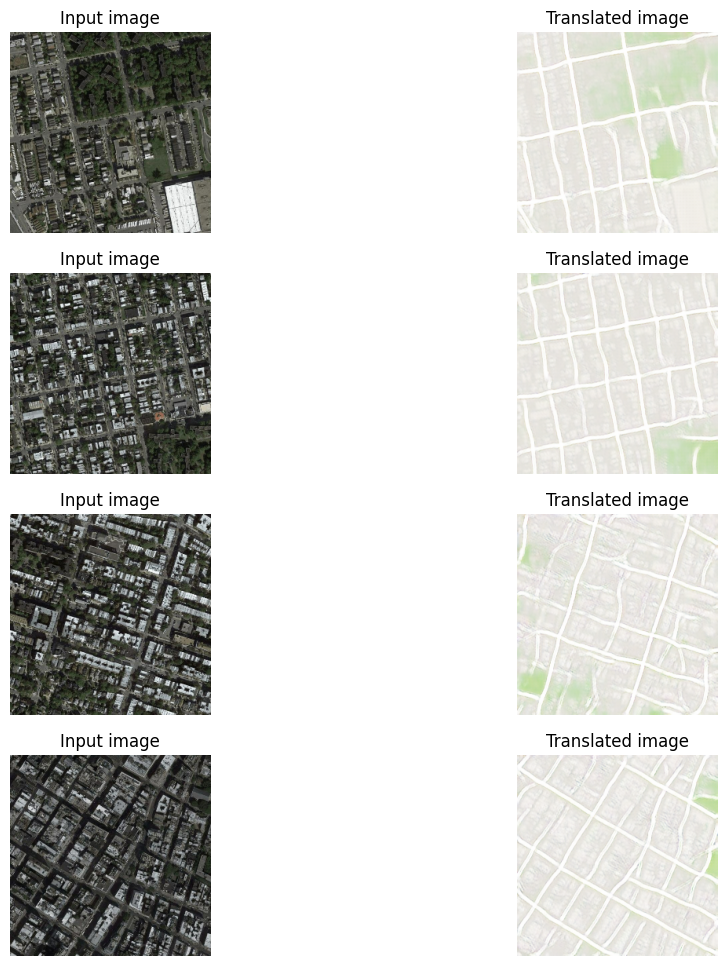

1096/1096 [==============================] - 272s 248ms/step - G_loss: 1.3933 - F_loss: 2.1521 - D_X_loss: 0.2228 - D_Y_loss: 0.1798


In [ ]:
# Loss function for evaluating adversarial loss
adv_loss_fn = keras.losses.MeanSquaredError()

# Define the loss function for the generators
def generator_loss_fn(fake):
    fake_loss = adv_loss_fn(tf.ones_like(fake), fake)
    return fake_loss


# Define the loss function for the discriminators
def discriminator_loss_fn(real, fake):
    real_loss = adv_loss_fn(tf.ones_like(real), real)
    fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5


# Create cycle gan model
cycle_gan_model = CycleGan(
    generator_G=gen_G, generator_F=gen_F, discriminator_X=disc_X, discriminator_Y=disc_Y
)

# Compile the model
cycle_gan_model.compile(
    gen_G_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks
plotter = GANMonitor()
checkpoint_filepath = "./model_checkpoints/cyclegan_checkpoints.{epoch:03d}"
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath, save_weights_only=True
)

# Here we will train the model for just one epoch as each epoch takes around
# 7 minutes on a single P100 backed machine.
cycle_gan_model.fit(
    tf.data.Dataset.zip((train_real, train_unreal)),
    epochs=10,
    callbacks=[plotter, model_checkpoint_callback],
)

 Model, fit fonksiyonu ile eğitilir; eğitim verileri, train_real ve train_unreal veri setlerinin birleştirilmesiyle oluşturulur. Eğitim, belirtilen epoch sayısı kadar devam eder ve bu örnekte 10 epoch olarak belirlenmiştir.


REFERANSLAR:

https://keras.io/examples/generative/cyclegan/
https://www.kaggle.com/datasets/suyashdamle/cyclegan
https://www.tensorflow.org/tutorials/generative/cyclegan
https://www.tensorflow.org/datasets/catalog/cycle_gan
https://www.youtube.com/watch?v=T-lBMrjZ3_0
https://www.youtube.com/watch?v=5jziBapziYE&t=17s